# Exploration du dataset

In [1]:
import pandas as pd
import os

# Lien du dataset : https://www.kaggle.com/vipoooool/new-plant-diseases-dataset
# Chemin du dossier dontenant les sous-dossiers des classes qui contiennent les images
root_path = r'C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train'

extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')

data = []

for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(extensions):
            data.append((os.path.join(dirpath, filename), os.path.basename(dirpath)))

df = pd.DataFrame(data, columns=['chemin', 'label'])

df.head()

,chemin,label
0,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple___Apple_scab
1,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple___Apple_scab
2,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple___Apple_scab
3,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple___Apple_scab
4,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple___Apple_scab


In [2]:
df.shape

(47968, 2)

## Affichage des images
### ( Une image par classe )

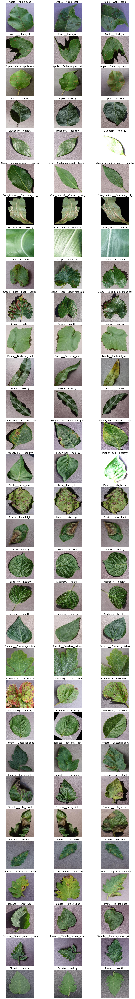

In [3]:
import matplotlib.pyplot as plt
from PIL import Image

fig = plt.figure(figsize=(16, 100))

for i, (label, group) in enumerate(df.groupby('label')):
    group = group.head(3)
    for j, (_, row) in enumerate(group.iterrows()):
        image_path = row['chemin']
        image = Image.open(image_path)
        ax = fig.add_subplot(len(df['label'].unique()), 3, i*3+j+1)
        ax.imshow(image)
        ax.set_title(label, fontsize=16)
        ax.axis('off')

        size = 300, 300
        image.thumbnail(size, Image.ANTIALIAS)

plt.tight_layout()
plt.show()

## DIstribution des classes 

In [4]:
image_counts = {}

for dirpath, dirnames, filenames in os.walk(root_path):
    image_count = 0
    for filename in filenames:
        if filename.lower().endswith(extensions):
            image_count += 1
    subdir_name = os.path.basename(dirpath)
    if subdir_name not in image_counts:
        image_counts[subdir_name] = image_count
    else:
        image_counts[subdir_name] += image_count

for subdir_name, image_count in image_counts.items():
    print('Le dossier {} contient {} images.'.format(subdir_name, image_count))

Le dossier train contient 0 images.
Le dossier Apple___Apple_scab contient 1501 images.
Le dossier Apple___Black_rot contient 1507 images.
Le dossier Apple___Cedar_apple_rust contient 224 images.
Le dossier Apple___healthy contient 2008 images.
Le dossier Blueberry___healthy contient 1816 images.
Le dossier Cherry_(including_sour)___healthy contient 657 images.
Le dossier Corn_(maize)___Common_rust_ contient 1907 images.
Le dossier Corn_(maize)___healthy contient 1408 images.
Le dossier Grape___Black_rot contient 1888 images.
Le dossier Grape___Esca_(Black_Measles) contient 1109 images.
Le dossier Grape___healthy contient 1692 images.
Le dossier Peach___Bacterial_spot contient 1838 images.
Le dossier Peach___healthy contient 1728 images.
Le dossier Pepper,_bell___Bacterial_spot contient 822 images.
Le dossier Pepper,_bell___healthy contient 1788 images.
Le dossier Potato___Early_blight contient 1939 images.
Le dossier Potato___healthy contient 1824 images.
Le dossier Potato___Late_blig

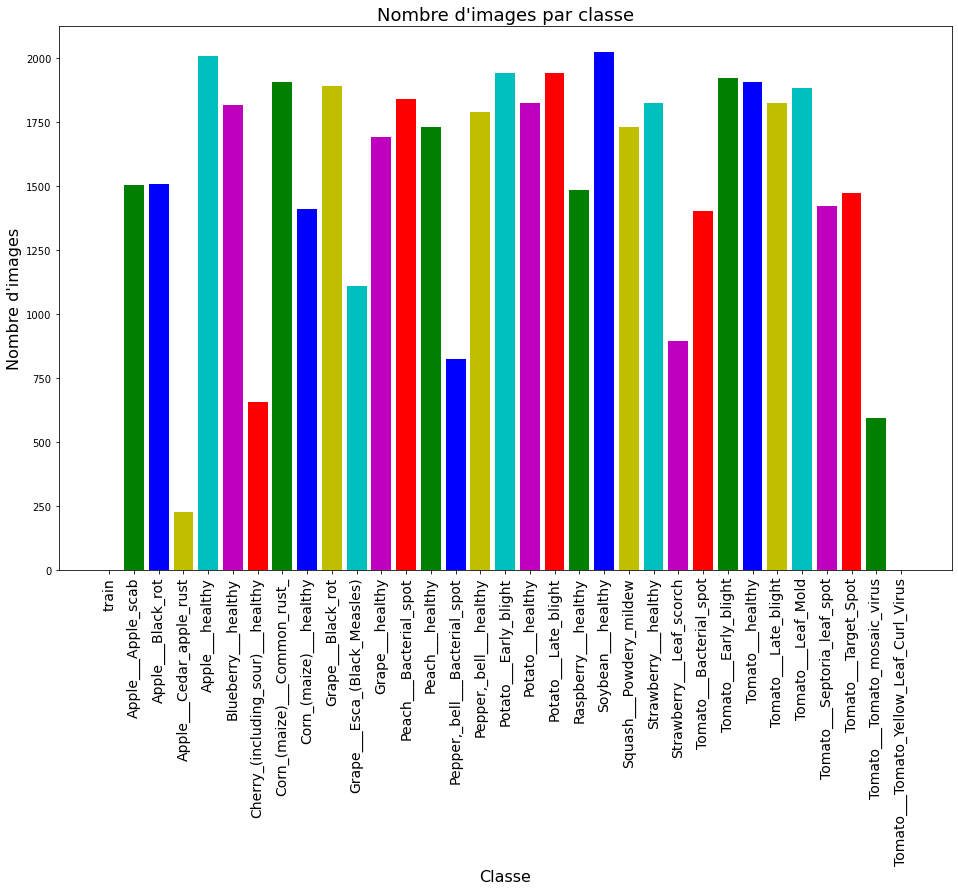

In [5]:
image_counts = {}

for dirpath, dirnames, filenames in os.walk(root_path):
    image_count = 0
    for filename in filenames:
        if filename.lower().endswith(extensions):
            image_count += 1
    subdir_name = os.path.basename(dirpath)
    if subdir_name not in image_counts:
        image_counts[subdir_name] = image_count
    else:
        image_counts[subdir_name] += image_count

plt.figure(figsize=(16, 10))
plt.bar(range(len(image_counts)), list(image_counts.values()), color=['r', 'g', 'b', 'y', 'c', 'm'])

plt.xticks(range(len(image_counts)), list(image_counts.keys()), rotation=90)

plt.gca().xaxis.set_tick_params(labelsize=14)
plt.gca().xaxis.set_ticklabels(list(image_counts.keys()), rotation=90)

plt.title('Nombre d\'images par classe', fontsize=18)
plt.xlabel('Classe', fontsize=16)
plt.ylabel('Nombre d\'images', fontsize=16)

plt.show()

## Encodage

In [6]:
import numpy as np

encodings = set()

for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(extensions):
            img = Image.open(os.path.join(dirpath, filename))
            encoding = img.mode
            encodings.add(encoding)

            encodings_array = np.array(encodings)

unique_encodings = np.unique(encodings_array)
print('Les différents types d\'encodages présents dans les images sont :', unique_encodings)

Les différents types d'encodages présents dans les images sont : [{'RGB'}]


Toutes les images sont encodées en RGB

## Taille des images

In [7]:
sizes = []

for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(extensions):
            img = Image.open(os.path.join(dirpath, filename))
            size = img.size
            sizes.append(size)

sizes_array = np.array(sizes)

print('Statistiques des tailles des images :')
print('Taille minimale :', np.min(sizes_array, axis=0))
print('Taille maximale :', np.max(sizes_array, axis=0))
print('Taille moyenne :', np.mean(sizes_array, axis=0))
print('Taille médiane :', np.median(sizes_array, axis=0))

Statistiques des tailles des images :
Taille minimale : [256 256]
Taille maximale : [256 256]
Taille moyenne : [256. 256.]
Taille médiane : [256. 256.]


Toutes les images sont de même taille : 256x256 

## Histogramme de la distribution des pixels (moyenne par classe)

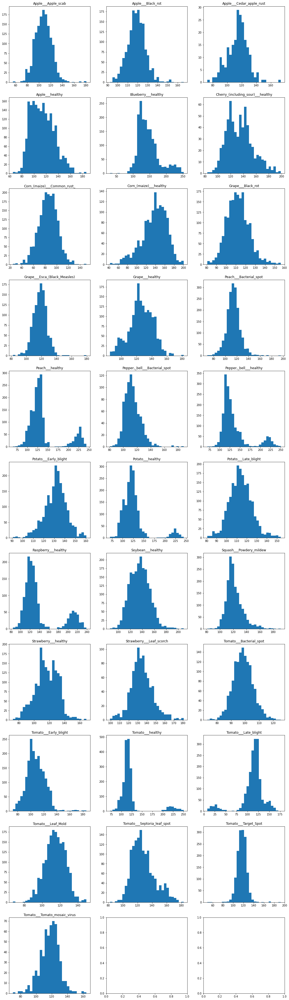

In [8]:
import cv2

data = []

for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(extensions):
            data.append((os.path.join(dirpath, filename), os.path.basename(dirpath)))

df = pd.DataFrame(data, columns=['chemin', 'label'])

fig, axs = plt.subplots(len(df['label'].unique())//3+1, 3, figsize=(18, 6*(len(df['label'].unique())//3+1)))

for i, label in enumerate(df['label'].unique()):
    img_paths = df[df['label'] == label]['chemin']
    mean_pixels = []
    for img_path in img_paths:
        img = cv2.imread(img_path)
        mean_pixels.append(np.mean(img))
    axs[i//3, i%3].hist(mean_pixels, bins=30)
    axs[i//3, i%3].set_title(label)

plt.show()

## Histogramme d'intensité (moyenne par classe par canal R, G et B)

In [9]:
intensity_dict = {}

for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(extensions):
            class_name = os.path.basename(dirpath)
            if class_name not in intensity_dict:
                intensity_dict[class_name] = {'R': [], 'G': [], 'B': []}
            img = Image.open(os.path.join(dirpath, filename))
            # Calcul des moyennes d'intensité pour chaque canal
            r_mean, g_mean, b_mean = np.mean(np.array(img), axis=(0, 1))
            # Ajout des moyennes d'intensité pour chaque canal à la liste pour la classe correspondante
            intensity_dict[class_name]['R'].append(r_mean)
            intensity_dict[class_name]['G'].append(g_mean)
            intensity_dict[class_name]['B'].append(b_mean)

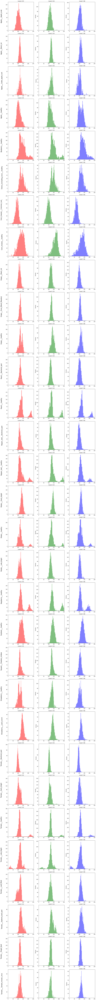

In [10]:
import seaborn as sns

fig, axes = plt.subplots(nrows=len(intensity_dict), ncols=3, figsize=(15, len(intensity_dict) * 5))

for i, (class_name, intensity_dict_class) in enumerate(intensity_dict.items()):
    for j, channel in enumerate(['R', 'G', 'B']):
        channel_means = intensity_dict_class[channel]
        axes[i, j].hist(channel_means, bins=50, color=['red', 'green', 'blue'][j], alpha=0.5)
        sns.kdeplot(channel_means, ax=axes[i, j], color=['red', 'green', 'blue'][j], linestyle='--', linewidth=2)
        axes[i, j].set_title('Canal {} ({})'.format(j + 1, channel))
        axes[i, j].set_xlim([0, 255])
        
    axes[i, 0].set_ylabel(class_name, rotation=90, labelpad=40, fontsize=15)
    
plt.tight_layout()
plt.show()